# 1. Set Environment & Libraries

In [1]:
# Data manipulation libraries
import os
import pandas as pd
import numpy as np

import warnings
warnings.filterwarnings('ignore')

import math
import shap

# Geo-related libraries
import geopandas as gpd
import osmnx as ox
import folium
from folium.plugins import HeatMap
import geopy
from geopy.geocoders import Nominatim
from geopy.extra.rate_limiter import RateLimiter
import contextily as ctx
import geofeather
from geopandas import GeoDataFrame
from shapely.geometry import Point
from shapely import wkt
from shapely.geometry import Point, MultiPoint
from shapely.ops import nearest_points
from shapely import wkt
import folium
from folium import Choropleth, Circle, Marker
from folium.plugins import HeatMap, MarkerCluster

# Visualization
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns

# Timer
from tqdm import tqdm, tqdm_notebook


# Regression
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import AdaBoostRegressor
from sklearn.ensemble import GradientBoostingRegressor
from xgboost import XGBRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.neighbors import KNeighborsRegressor


# Model support functions
from sklearn import model_selection
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import PolynomialFeatures
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from scipy.stats import uniform
from sklearn.preprocessing import StandardScaler
from pprint import pprint
from sklearn.inspection import permutation_importance
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.model_selection import RepeatedStratifiedKFold
from skopt import BayesSearchCV

# 2. Load Data

In [2]:
df_1 = pd.read_csv('ca-housing/ca-housing.csv')
df_1.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,ocean_proximity,median_house_value
0,-122.23,37.88,41,880,129.0,322,126,8.3252,NEAR BAY,452600
1,-122.22,37.86,21,7099,1106.0,2401,1138,8.3014,NEAR BAY,358500
2,-122.24,37.85,52,1467,190.0,496,177,7.2574,NEAR BAY,352100
3,-122.25,37.85,52,1274,235.0,558,219,5.6431,NEAR BAY,341300
4,-122.25,37.85,52,1627,280.0,565,259,3.8462,NEAR BAY,342200


In [3]:
df_1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20640 entries, 0 to 20639
Data columns (total 10 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   longitude           20640 non-null  float64
 1   latitude            20640 non-null  float64
 2   housing_median_age  20640 non-null  int64  
 3   total_rooms         20640 non-null  int64  
 4   total_bedrooms      20433 non-null  float64
 5   population          20640 non-null  int64  
 6   households          20640 non-null  int64  
 7   median_income       20640 non-null  float64
 8   ocean_proximity     20640 non-null  object 
 9   median_house_value  20640 non-null  int64  
dtypes: float64(4), int64(5), object(1)
memory usage: 1.6+ MB


In [4]:
gpd_1_degree = gpd.GeoDataFrame(df_1, geometry=gpd.points_from_xy(df_1.longitude, df_1.latitude), crs={'init' :'epsg:4326'})
gpd_1_degree.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 20640 entries, 0 to 20639
Data columns (total 11 columns):
 #   Column              Non-Null Count  Dtype   
---  ------              --------------  -----   
 0   longitude           20640 non-null  float64 
 1   latitude            20640 non-null  float64 
 2   housing_median_age  20640 non-null  int64   
 3   total_rooms         20640 non-null  int64   
 4   total_bedrooms      20433 non-null  float64 
 5   population          20640 non-null  int64   
 6   households          20640 non-null  int64   
 7   median_income       20640 non-null  float64 
 8   ocean_proximity     20640 non-null  object  
 9   median_house_value  20640 non-null  int64   
 10  geometry            20640 non-null  geometry
dtypes: float64(4), geometry(1), int64(5), object(1)
memory usage: 1.7+ MB


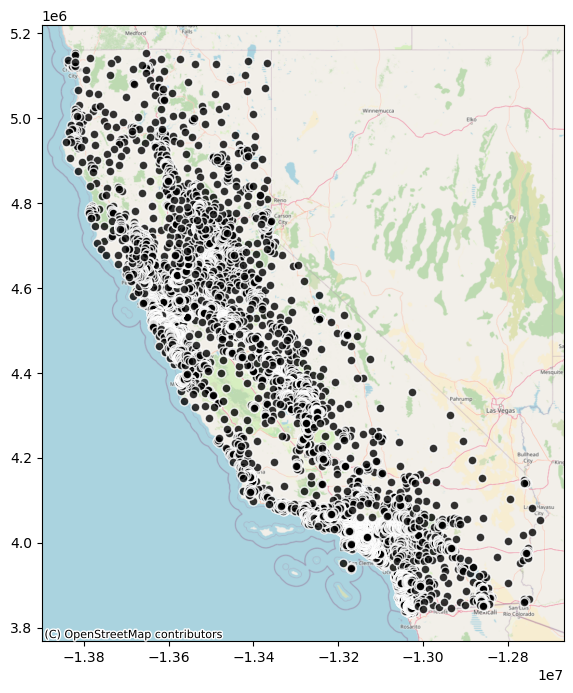

In [5]:
# draw a figure

fig, ax = plt.subplots(figsize=(10, 8))
gpd_1_degree.to_crs(epsg=3857).plot(ax = ax,
                figsize=(12,12),
                markersize=40,
               color="black",
               edgecolor="white",
               alpha=0.8,
               marker="o"
            );
ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik)

In [6]:
m_1 = folium.Map(location=[df_1.latitude.mean()+1.8,df_1.longitude.mean()], tiles='cartodbpositron', zoom_start=6, width=600, height=600)

# Add a heatmap to the base map

HeatMap(data=df_1[['latitude', 'longitude']], radius=15, gradient={0.0: 'blue',
                0.6: 'cyan',
                0.7: 'lime',
                0.8: 'yellow',
                1.0: 'red'}).add_to(m_1)
# Display the map
m_1

# 3. Data Cleaning

In [7]:
df_1.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,ocean_proximity,median_house_value
0,-122.23,37.88,41,880,129.0,322,126,8.3252,NEAR BAY,452600
1,-122.22,37.86,21,7099,1106.0,2401,1138,8.3014,NEAR BAY,358500
2,-122.24,37.85,52,1467,190.0,496,177,7.2574,NEAR BAY,352100
3,-122.25,37.85,52,1274,235.0,558,219,5.6431,NEAR BAY,341300
4,-122.25,37.85,52,1627,280.0,565,259,3.8462,NEAR BAY,342200


In [8]:
df_1.nunique()

longitude               844
latitude                862
housing_median_age       52
total_rooms            5926
total_bedrooms         1923
population             3888
households             1815
median_income         12928
ocean_proximity           5
median_house_value     3842
dtype: int64

## Missing Data

In [9]:
# (0) Size of data
print ("Num of rows: " + str(df_1.shape[0])) # row count
print ("Num of columns: " + str(df_1.shape[1])) # col count

Num of rows: 20640
Num of columns: 10


In [10]:
# (1) Check missing data
print("*** Missing Values ***")
print('Sum of N/A values')
df_1.isnull().sum()

*** Missing Values ***
Sum of N/A values


longitude               0
latitude                0
housing_median_age      0
total_rooms             0
total_bedrooms        207
population              0
households              0
median_income           0
ocean_proximity         0
median_house_value      0
dtype: int64

In [11]:
gpd_miss = gpd_1_degree[df_1['total_bedrooms'].isnull()]
gpd_miss.head(2)

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,ocean_proximity,median_house_value,geometry
290,-122.16,37.77,47,1256,NaN,570,218,4.3750,NEAR BAY,161900,POINT (-122.16000 37.77000)
341,-122.17,37.75,38,992,NaN,732,259,1.6196,NEAR BAY,85100,POINT (-122.17000 37.75000)


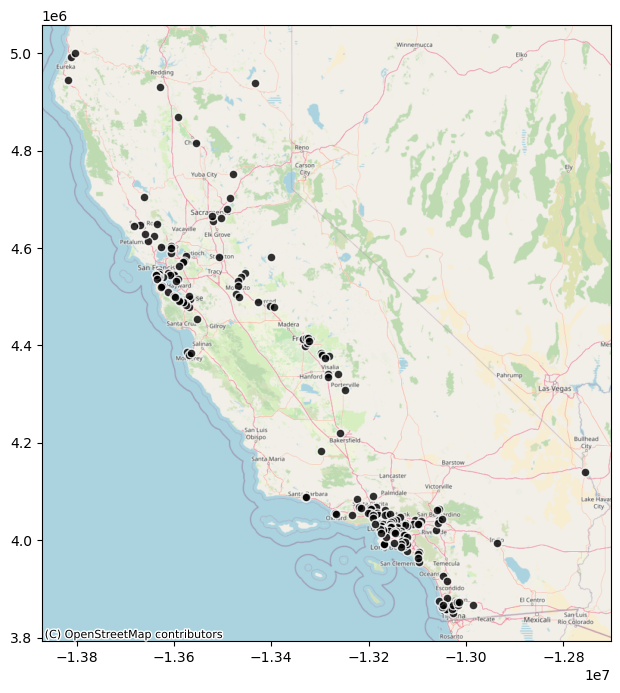

In [12]:
fig, ax = plt.subplots(figsize=(10, 8))
gpd_miss.to_crs(epsg=3857).plot(ax = ax,
                figsize=(12,12),
                markersize=40,
               color="black",
               edgecolor="white",
               alpha=0.8,
               marker="o"
            );
ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik)

In [13]:
df_1_miss = df_1.dropna().reset_index()
df_1_miss.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20433 entries, 0 to 20432
Data columns (total 11 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   index               20433 non-null  int64  
 1   longitude           20433 non-null  float64
 2   latitude            20433 non-null  float64
 3   housing_median_age  20433 non-null  int64  
 4   total_rooms         20433 non-null  int64  
 5   total_bedrooms      20433 non-null  float64
 6   population          20433 non-null  int64  
 7   households          20433 non-null  int64  
 8   median_income       20433 non-null  float64
 9   ocean_proximity     20433 non-null  object 
 10  median_house_value  20433 non-null  int64  
dtypes: float64(4), int64(6), object(1)
memory usage: 1.7+ MB


## Outliers

<Axes: ylabel='median_income'>

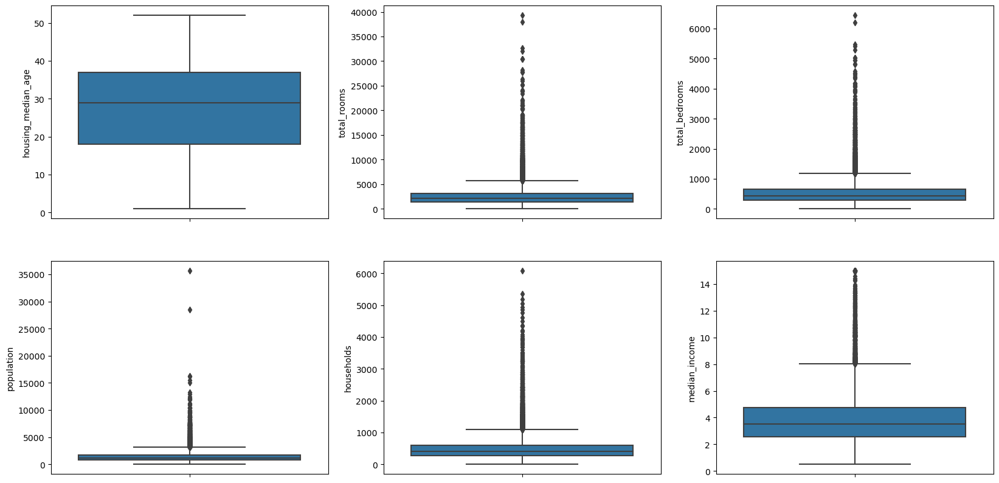

In [14]:
df_1_out = df_1_miss.copy()
_,axss = plt.subplots(2,3, figsize=[20,10])  # create a 2x3 matrix = 6 figures
sns.boxplot(y ='housing_median_age', data=df_1_out, ax=axss[0, 0])
sns.boxplot(y ='total_rooms', data=df_1_out, ax=axss[0, 1])
sns.boxplot(y ='total_bedrooms', data=df_1_out, ax=axss[0, 2])
sns.boxplot(y ='population', data=df_1_out, ax=axss[1][0])
sns.boxplot(y ='households', data=df_1_out, ax=axss[1][1])
sns.boxplot(y ='median_income', data=df_1_out, ax=axss[1][2])

In [15]:
df_1_out.loc[df_1_out['population'] > 15000, 'population'] = 15000

<Axes: ylabel='population'>

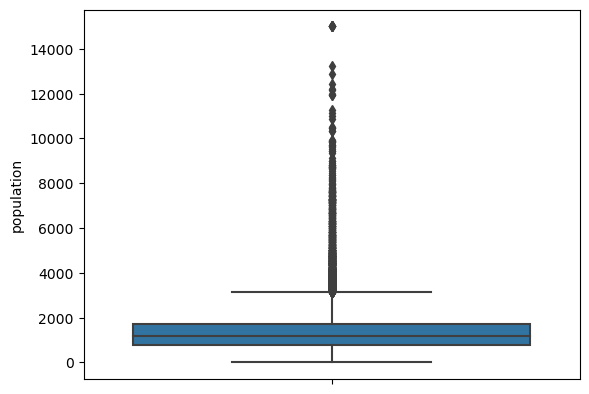

In [16]:
sns.boxplot(y ='population', data=df_1_out)

# 4. Feature Engineering

## County

In [17]:
county = gpd.read_file('ca-housing/CA_Counties_TIGER2016.shp')
county = county.reset_index()
county.head(2)

,index,STATEFP,COUNTYFP,COUNTYNS,GEOID,NAME,NAMELSAD,LSAD,CLASSFP,MTFCC,CSAFP,CBSAFP,METDIVFP,FUNCSTAT,ALAND,AWATER,INTPTLAT,INTPTLON,geometry
0,0,06,091,00277310,06091,Sierra,Sierra County,06,H1,G4020,NaN,NaN,NaN,A,2468694587,23299110,+39.5769252,-120.5219926,"POLYGON ((-13431319.751 4821511.426, -13431312..."
1,1,06,067,00277298,06067,Sacramento,Sacramento County,06,H1,G4020,472,40900,NaN,A,2499183617,76073827,+38.4500114,-121.3404409,"POLYGON ((-13490651.476 4680831.603, -13490511..."


In [18]:
county = county.to_crs(gpd_1_degree.crs)
county = county[['NAME','INTPTLAT','INTPTLON','geometry']]
county.head()

,NAME,INTPTLAT,INTPTLON,geometry
0,Sierra,+39.5769252,-120.5219926,"POLYGON ((-120.65560 39.69357, -120.65554 39.6..."
1,Sacramento,+38.4500114,-121.3404409,"POLYGON ((-121.18858 38.71431, -121.18732 38.7..."
2,Santa Barbara,+34.5370572,-120.0399729,"MULTIPOLYGON (((-120.58191 34.09856, -120.5822..."
3,Calaveras,+38.1838996,-120.5614415,"POLYGON ((-120.63095 38.34111, -120.63058 38.3..."
4,Ventura,+34.3587415,-119.1331432,"MULTIPOLYGON (((-119.63631 33.27304, -119.6360..."


In [19]:
gpd_2_degree = gpd.GeoDataFrame(df_1_out, geometry=gpd.points_from_xy(df_1_out.longitude, df_1_out.latitude), crs={'init' :'epsg:4326'})
gdf_with_county = gpd.sjoin(gpd_2_degree, county, how="left", op="within")
gdf_with_county = gdf_with_county.rename(columns={'NAME': 'county_name'})
county = county.rename(columns={'NAME': 'county_name'})
county = county.set_index("county_name")
gdf_with_county.drop(['index_right'],axis=1,inplace=True)
gdf_with_county.head(2)

,index,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,ocean_proximity,median_house_value,geometry,county_name,INTPTLAT,INTPTLON
0,0,-122.23,37.88,41,880,129.0,322,126,8.3252,NEAR BAY,452600,POINT (-122.23000 37.88000),Alameda,+37.6471385,-121.9124880
1,1,-122.22,37.86,21,7099,1106.0,2401,1138,8.3014,NEAR BAY,358500,POINT (-122.22000 37.86000),Alameda,+37.6471385,-121.9124880


In [20]:
county_mean = gdf_with_county.groupby('county_name')['median_house_value'].mean()
county_mean.sort_values(ascending=False).head()

county_name
Marin            357674.855422
San Mateo        347769.861991
San Francisco    339374.278169
Santa Clara      302056.927346
Santa Cruz       259426.183246
Name: median_house_value, dtype: float64

In [21]:
# Create a base map
m_2 = folium.Map(location=[df_1.latitude.mean()+1.8,df_1.longitude.mean()], tiles='cartodbpositron', zoom_start=6, width=600, height=600)

# Add a choropleth map to the base map
Choropleth(geo_data=county.__geo_interface__,
           data=county_mean,
           key_on="feature.id",
           fill_color='YlGnBu',
           legend_name='mean house values in different counties'
          ).add_to(m_2)

# Display the map
m_2

In [22]:
df_1_out[['county_name','INTPTLAT','INTPTLON']]=gdf_with_county[['county_name','INTPTLAT','INTPTLON']]
df_1_out.dropna(inplace=True)
df_1_out = df_1_out.reset_index()
gdf_1_out = gpd.GeoDataFrame(df_1_out, geometry=gpd.points_from_xy(df_1_out['longitude'], df_1_out['latitude']), crs={'init' :'epsg:4326'})
gdf_2_out = gpd.GeoDataFrame(df_1_out, geometry=gpd.points_from_xy(df_1_out['INTPTLON'], df_1_out['INTPTLAT']), crs={'init' :'epsg:4326'})

gdf_1_out['geoint'] = gdf_2_out['geometry']
df_1_out[['geometry','geoint']] = gdf_1_out[['geometry','geoint']]

In [23]:
gdf_3 = gdf_1_out.copy()
df_1_out['center_dist'] = gdf_3.to_crs('EPSG:5234').distance(gdf_2_out['geometry'].to_crs('EPSG:5234'))
df_1_out.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20430 entries, 0 to 20429
Data columns (total 18 columns):
 #   Column              Non-Null Count  Dtype   
---  ------              --------------  -----   
 0   level_0             20430 non-null  int64   
 1   index               20430 non-null  int64   
 2   longitude           20430 non-null  float64 
 3   latitude            20430 non-null  float64 
 4   housing_median_age  20430 non-null  int64   
 5   total_rooms         20430 non-null  int64   
 6   total_bedrooms      20430 non-null  float64 
 7   population          20430 non-null  int64   
 8   households          20430 non-null  int64   
 9   median_income       20430 non-null  float64 
 10  ocean_proximity     20430 non-null  object  
 11  median_house_value  20430 non-null  int64   
 12  county_name         20430 non-null  object  
 13  INTPTLAT            20430 non-null  object  
 14  INTPTLON            20430 non-null  object  
 15  geometry            20430 non-null  

## City

In [24]:
LA_poly = ox.geocode_to_gdf('Los Angeles, California')
LA_poly.drop(['geometry'], axis=1, inplace=True)
LA_place = gpd.GeoDataFrame(LA_poly, geometry=gpd.points_from_xy(LA_poly['lon'], LA_poly['lat']), crs={'init' :'epsg:4326'})
LA_place

,bbox_north,bbox_south,bbox_east,bbox_west,place_id,osm_type,osm_id,lat,lon,class,type,place_rank,importance,addresstype,name,display_name,geometry
0,34.337306,33.659541,-118.155295,-118.668178,369447345,relation,207359,34.053691,-118.242766,boundary,administrative,16,0.773805,city,Los Angeles,"Los Angeles, Los Angeles County, California, U...",POINT (-118.24277 34.05369)


In [25]:
SF_poly = ox.geocode_to_gdf('San Francisco, California')
SF_poly.drop(['geometry'], axis=1, inplace=True)
SF_place = gpd.GeoDataFrame(SF_poly, geometry=gpd.points_from_xy(SF_poly['lon'], SF_poly['lat']), crs={'init' :'epsg:4326'})
SF_place

,bbox_north,bbox_south,bbox_east,bbox_west,place_id,osm_type,osm_id,lat,lon,class,type,place_rank,importance,addresstype,name,display_name,geometry
0,37.929811,37.640314,-122.281479,-123.173825,312148942,relation,111968,37.779026,-122.419906,boundary,administrative,12,0.725131,city,San Francisco,"San Francisco, California, United States",POINT (-122.41991 37.77903)


In [26]:
df_1_out['LA_dist'] = gdf_1_out['geometry'].to_crs('EPSG:5234').apply(lambda x: x.distance(LA_place['geometry'].to_crs('EPSG:5234')))
df_1_out['SF_dist'] = gdf_1_out['geometry'].to_crs('EPSG:5234').apply(lambda x: x.distance(SF_place['geometry'].to_crs('EPSG:5234')))
df_1_out.head(2)

,level_0,index,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,ocean_proximity,median_house_value,county_name,INTPTLAT,INTPTLON,geometry,geoint,center_dist,LA_dist,SF_dist
0,0,0,-122.23,37.88,41,880,129.0,322,126,8.3252,NEAR BAY,452600,Alameda,+37.6471385,-121.9124880,POINT (-122.23000 37.88000),POINT (-121.91249 37.64714),40015.688378,581128.195192,21167.241391
1,1,1,-122.22,37.86,21,7099,1106.0,2401,1138,8.3014,NEAR BAY,358500,Alameda,+37.6471385,-121.9124880,POINT (-122.22000 37.86000),POINT (-121.91249 37.64714),37771.343194,578778.072326,20783.882592


## Category Encoding

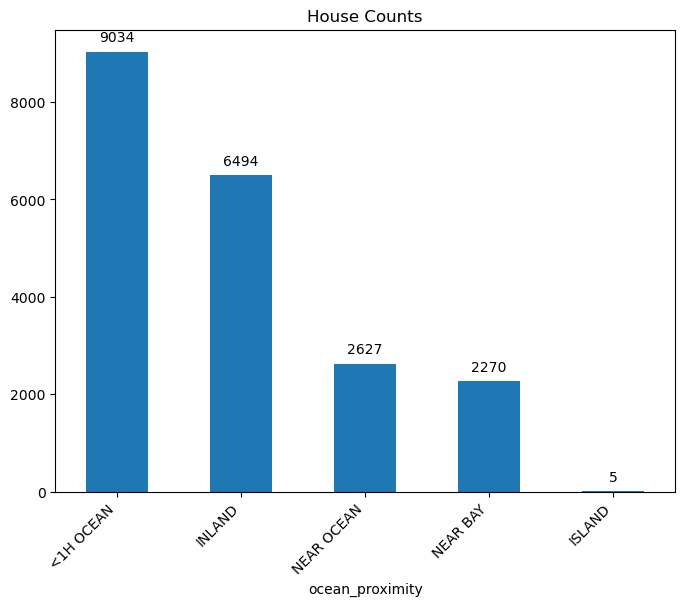

In [68]:
fig, ax = plt.subplots(figsize=(8, 6))
df_1_out.ocean_proximity.value_counts().plot(kind='bar', title="House Counts")
for p in ax.patches:
    ax.annotate(str(p.get_height()), (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', xytext=(0, 10), textcoords='offset points')
ax.set_xticklabels(
    ax.get_xticklabels(),
    rotation=45,
    horizontalalignment='right')
plt.show()

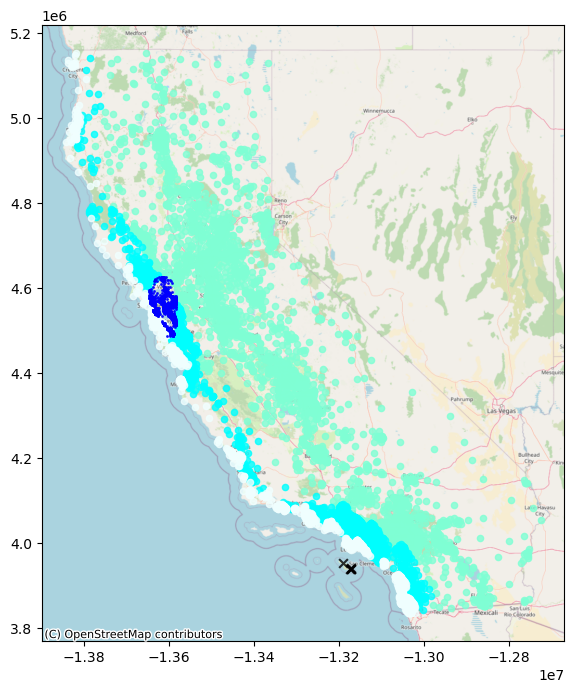

In [28]:
fig, ax = plt.subplots(figsize=(10, 8))
gdf_1_out[gdf_1_out.ocean_proximity=='INLAND'].to_crs(epsg=3857).plot(ax = ax,
                figsize=(12,12),markersize=20,color='aquamarine',
               alpha=0.8,marker="o")
gdf_1_out[gdf_1_out.ocean_proximity=='<1H OCEAN'].to_crs(epsg=3857).plot(ax = ax,
                figsize=(12,12),markersize=20,color='aqua',
               alpha=0.8,marker="o")
gdf_1_out[gdf_1_out.ocean_proximity=='NEAR OCEAN'].to_crs(epsg=3857).plot(ax = ax,
                figsize=(12,12),markersize=20,color='azure',
               alpha=0.8,marker="o")
gdf_1_out[gdf_1_out.ocean_proximity=='NEAR BAY'].to_crs(epsg=3857).plot(ax = ax,
                figsize=(12,12),markersize=5,color='blue',
               alpha=0.8,marker=".")
gdf_1_out[gdf_1_out.ocean_proximity=='ISLAND'].to_crs(epsg=3857).plot(ax = ax,
                figsize=(12,12),markersize=40,color='black',
               alpha=0.8,marker="x")
ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik)

In [29]:
df_2 = df_1_out.copy()
df_2['near_bay'] = 0
df_2.loc[df_2.ocean_proximity == 'NEAR BAY', 'near_bay'] = 1
df_2["ocean_proximity"] = df_2["ocean_proximity"].map({"INLAND":0, "<1H OCEAN":1, "NEAR OCEAN":2, "NEAR BAY":1, "ISLAND":3})

df_2.head()

,level_0,index,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,...,median_house_value,county_name,INTPTLAT,INTPTLON,geometry,geoint,center_dist,LA_dist,SF_dist,near_bay
0,0,0,-122.23,37.88,41,880,129.0,322,126,8.3252,...,452600,Alameda,+37.6471385,-121.9124880,POINT (-122.23000 37.88000),POINT (-121.91249 37.64714),40015.688378,581128.195192,21167.241391,1
1,1,1,-122.22,37.86,21,7099,1106.0,2401,1138,8.3014,...,358500,Alameda,+37.6471385,-121.9124880,POINT (-122.22000 37.86000),POINT (-121.91249 37.64714),37771.343194,578778.072326,20783.882592,1
2,2,2,-122.24,37.85,52,1467,190.0,496,177,7.2574,...,352100,Alameda,+37.6471385,-121.9124880,POINT (-122.24000 37.85000),POINT (-121.91249 37.64714),38461.481490,579161.503646,18606.718022,1
3,3,3,-122.25,37.85,52,1274,235.0,558,219,5.6431,...,341300,Alameda,+37.6471385,-121.9124880,POINT (-122.25000 37.85000),POINT (-121.91249 37.64714),39196.556164,579786.348327,17782.691339,1
4,4,4,-122.25,37.85,52,1627,280.0,565,259,3.8462,...,342200,Alameda,+37.6471385,-121.9124880,POINT (-122.25000 37.85000),POINT (-121.91249 37.64714),39196.556164,579786.348327,17782.691339,1


## Data Preparation

In [30]:
df_2.nunique()

level_0               20430
index                 20430
longitude               843
latitude                860
housing_median_age       52
total_rooms            5911
total_bedrooms         1923
population             3874
households             1809
median_income         12823
ocean_proximity           4
median_house_value     3833
county_name              58
INTPTLAT                 58
INTPTLON                 58
geometry              12504
geoint                   58
center_dist           12504
LA_dist               12504
SF_dist               12504
near_bay                  2
dtype: int64

In [31]:
df_2['house_value'] = df_2['median_house_value']
df_2.drop(['level_0','index','county_name','INTPTLAT','INTPTLON','geoint','median_house_value'],axis=1,inplace=True)
df_2.head(2)

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,ocean_proximity,geometry,center_dist,LA_dist,SF_dist,near_bay,house_value
0,-122.23,37.88,41,880,129.0,322,126,8.3252,1,POINT (-122.23000 37.88000),40015.688378,581128.195192,21167.241391,1,452600
1,-122.22,37.86,21,7099,1106.0,2401,1138,8.3014,1,POINT (-122.22000 37.86000),37771.343194,578778.072326,20783.882592,1,358500


In [32]:
numerical = df_2.drop(['geometry','near_bay'],axis=1).columns
categorical = ['geometry','near_bay']
df_vis = gpd.GeoDataFrame(df_2, geometry = df_2['geometry'], crs={'init' :'epsg:4326'})

# 5. Data Visualization

## Correlation Matrix

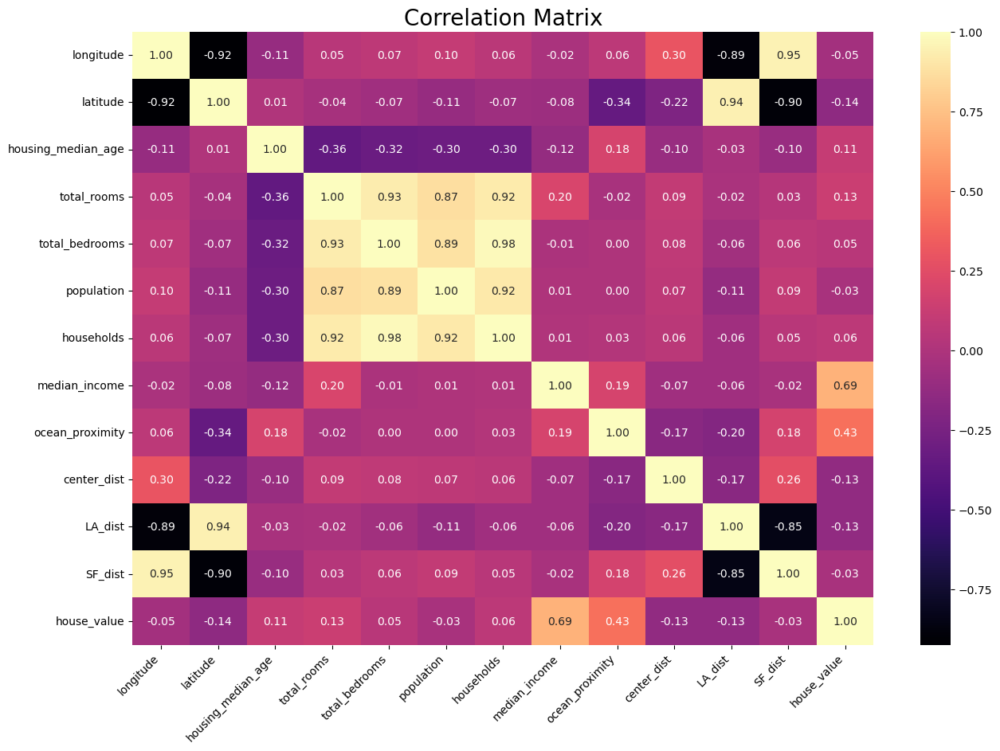

In [33]:
f, ax = plt.subplots(figsize= [15,10])
sns.heatmap(df_vis[numerical].corr(), annot=True, fmt=".2f", ax=ax, cmap = "magma" )
ax.set_title("Correlation Matrix", fontsize=20)
ax.set_xticklabels(
    ax.get_xticklabels(),
    rotation=45,
    horizontalalignment='right')
plt.show()

## Map

In [80]:
# plt.figure(figsize = (10, 8))
# plt.scatter(df_vis.longitude, df_vis.latitude, s=5, c = df_vis.house_value)
# plt.colorbar(); plt.xlabel('Longitude', fontsize=18); plt.ylabel('Latitude', fontsize=18)

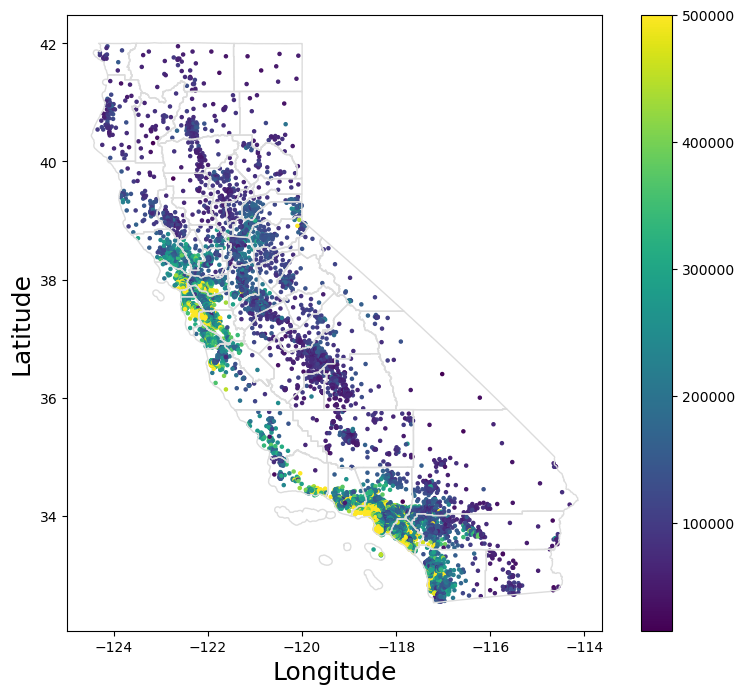

In [81]:
from mpl_toolkits.axes_grid1 import make_axes_locatable

ax = county.plot(figsize=(10,8), color='none', edgecolor='gainsboro', zorder=3)
value_plot = df_vis.plot(column='house_value', s=5, ax=ax, legend=True)
plt.xlabel('Longitude', fontsize=18); plt.ylabel('Latitude', fontsize=18)

plt.show()

## Boxplot

<Axes: xlabel='near_bay', ylabel='house_value'>

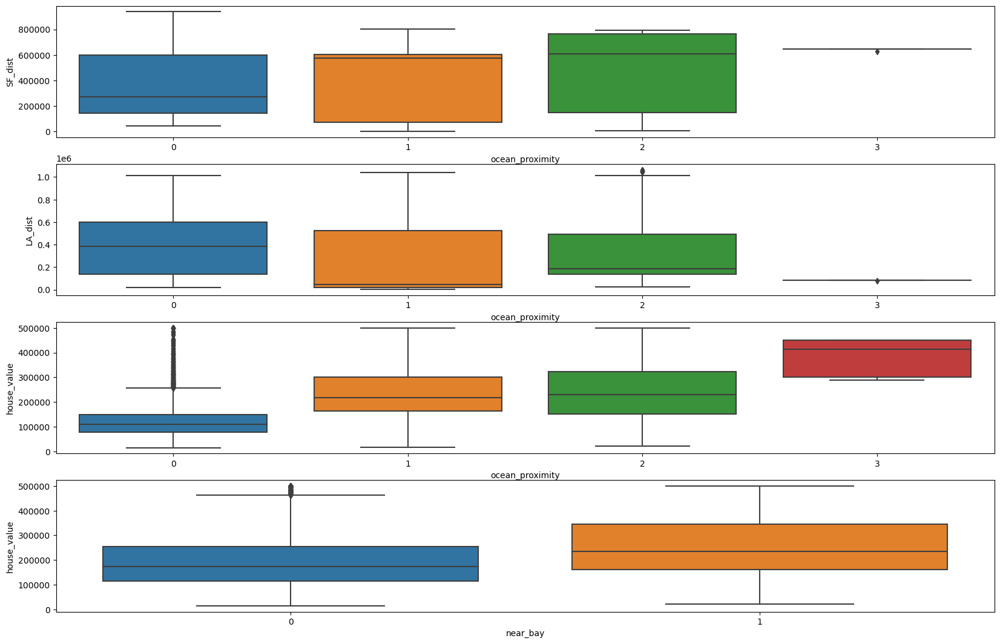

<Figure size 2000x400 with 0 Axes>

In [35]:
_,axss = plt.subplots(4,1, figsize=[20,13])
plt.figure(figsize=(20,4))
sns.boxplot(x = df_vis['ocean_proximity'], y = df_vis['SF_dist'], ax=axss[0])
sns.boxplot(x = df_vis['ocean_proximity'], y = df_vis['LA_dist'], ax=axss[1])
sns.boxplot(x = df_vis['ocean_proximity'], y = df_vis['house_value'], ax=axss[2])
sns.boxplot(x = df_vis['near_bay'], y = df_vis['house_value'], ax=axss[3])

## distance

Text(0, 0.5, 'Median House Value')

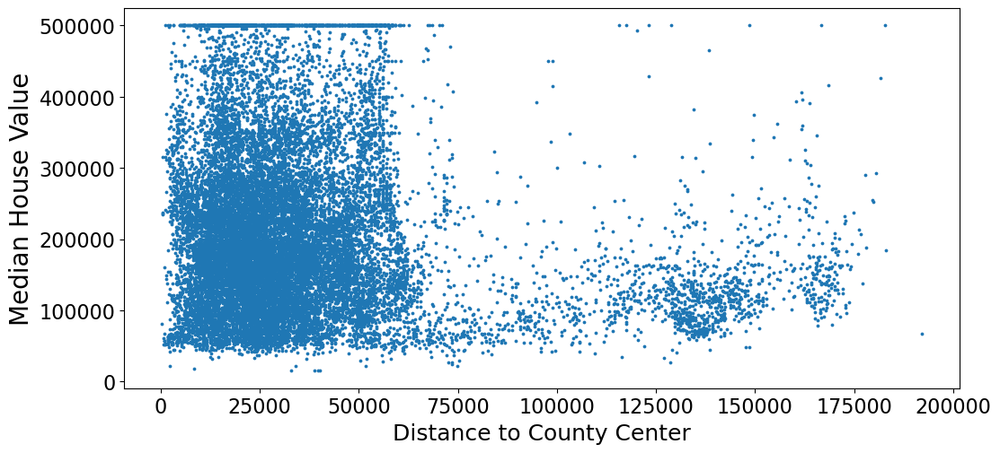

In [36]:
plt.figure(figsize=(12, 5.5))
plt.scatter(df_vis['center_dist'], df_vis['house_value'], s=3)
# plt.ylim(10, 45)
plt.tick_params(labelsize=16)
plt.xlabel('Distance to County Center', fontsize=18); plt.ylabel('Median House Value', fontsize=20)

Text(0, 0.5, 'Median House Value')

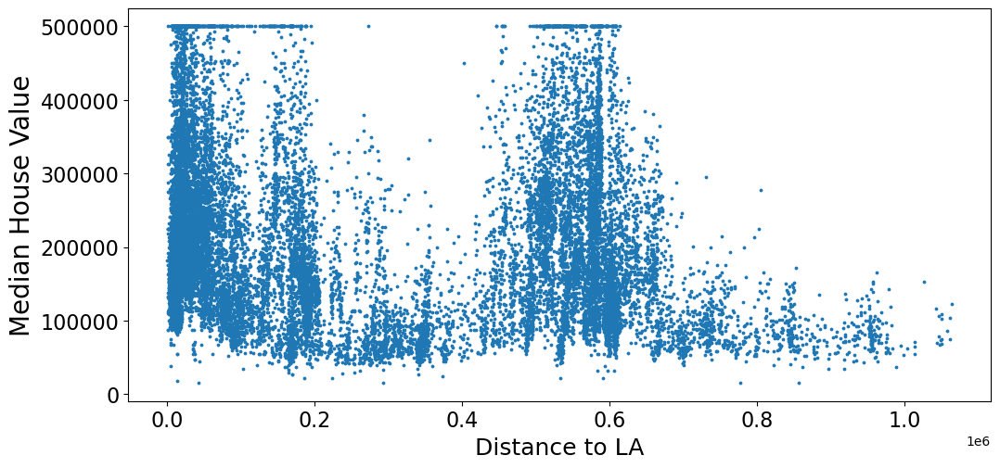

In [37]:
plt.figure(figsize=(12, 5.5))
plt.scatter(df_vis['LA_dist'], df_vis['house_value'], s=3)
# plt.ylim(10, 45)
plt.tick_params(labelsize=16)
plt.xlabel('Distance to LA', fontsize=18); plt.ylabel('Median House Value', fontsize=20)

Text(0, 0.5, 'Median House Value')

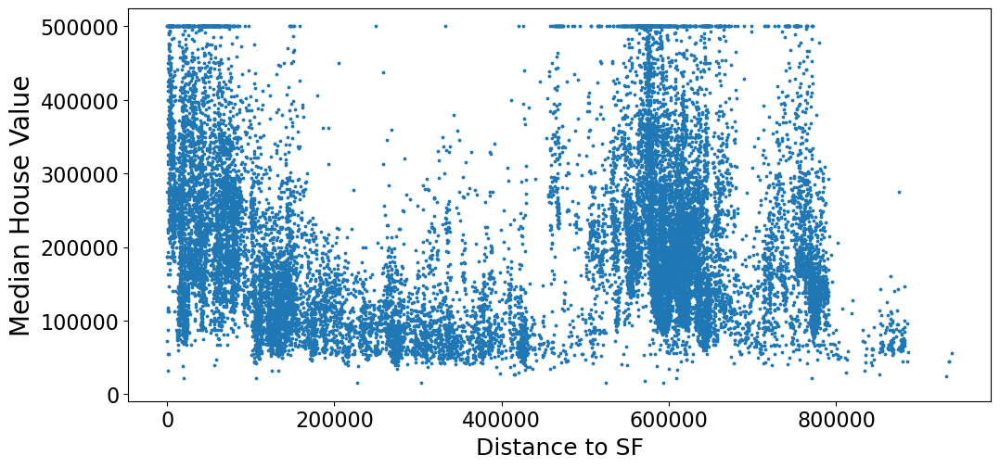

In [38]:
plt.figure(figsize=(12, 5.5))
plt.scatter(df_vis['SF_dist'], df_vis['house_value'], s=3)
# plt.ylim(10, 45)
plt.tick_params(labelsize=16)
plt.xlabel('Distance to SF', fontsize=18); plt.ylabel('Median House Value', fontsize=20)

# 6. Model

In [39]:
df_model = df_vis.copy()

def abline(slope, intercept):
    """Plot a line from slope and intercept"""
    axes = plt.gca()
    x_vals = np.array(axes.get_xlim())
    y_vals = intercept + slope * x_vals
    plt.plot(x_vals, y_vals, '-', color='black')


def pred_summary(pred, ytest, limit = 500000):
    """Plotting for test set predictions"""
    sns.scatterplot(x=pred, y=ytest)
    abline(1, 0) #1-1 line
    plt.ylim(0, limit); plt.xlim(0, limit)
    plt.tick_params(labelsize=18)

    print('RMSE', np.sqrt(mean_squared_error(ytest, pred)))
    print('R2', r2_score(ytest, pred))



def plot_corr(df, size=10, MI = False):
    '''Function plots a graphical correlation matrix for each pair of columns in the dataframe.

    Input:
        df: pandas DataFrame
        size: vertical and horizontal size of the plot'''
    if MI == False:
        corr = df.corr()
    else:
        K = df.shape[1]
        corr = np.empty((K, K), dtype=float)

        for i, ac in enumerate(X.columns):
            for j, bc in enumerate(X.columns):
                MI = mutual_information(X.loc[:, ac], X.loc[:, bc], bins=10, normalize=True)
                corr[i, j] = MI

    fig, ax = plt.subplots(figsize=(size, size))
    ax.matshow(corr)
    plt.xticks(range(len(corr.columns)), corr.columns);
    plt.yticks(range(len(corr.columns)), corr.columns);

## Train-Test Split & Feature Scaling

In [40]:
X = df_model.drop(['longitude','latitude','geometry','house_value'],axis=1)
y = df_model['house_value']
X.head(2)
# y.head(2)

,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,ocean_proximity,center_dist,LA_dist,SF_dist,near_bay
0,41,880,129.0,322,126,8.3252,1,40015.688378,581128.195192,21167.241391,1
1,21,7099,1106.0,2401,1138,8.3014,1,37771.343194,578778.072326,20783.882592,1


In [41]:
X_train, X_test, y_train, y_test = model_selection.train_test_split(X, y, test_size=0.25, random_state= 1)
# Feature Scaling
scaler = StandardScaler()      # initialize the class and call it scaler
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)    # apply above-calculated min&std to X_test data (testing data could only use parameters from training data)
print('Training data has ' + str(X_train.shape[0]) + ' observation with ' + str(X_train.shape[1]) + ' features')
print('Test data has ' + str(X_test.shape[0]) + ' observation with ' + str(X_test.shape[1]) + ' features')

Training data has 15322 observation with 11 features
Test data has 5108 observation with 11 features


## Random Forest

In [42]:
from sklearn.ensemble import RandomForestRegressor

forest = RandomForestRegressor(n_jobs=2)

params = {'max_features': [3, 4, 5],
          'n_estimators': [150, 200]}

forest_grid = GridSearchCV(forest, params, cv=5, scoring = 'neg_mean_squared_error')
forest_grid.fit(X_train, y_train)

GridSearchCV(cv=5, estimator=RandomForestRegressor(n_jobs=2),
             param_grid={'max_features': [3, 4, 5], 'n_estimators': [150, 200]},
             scoring='neg_mean_squared_error')

In [43]:
#Best estimator and CV score
print('Best score (RMSE)', np.sqrt(np.abs(forest_grid.best_score_)))
print(forest_grid.best_estimator_)

Best score (RMSE) 49173.69171832953
RandomForestRegressor(max_features=4, n_estimators=150, n_jobs=2)


RMSE 49671.63848734416
R2 0.8204417361355247


Text(0.5, 1.0, 'Performance of RF')

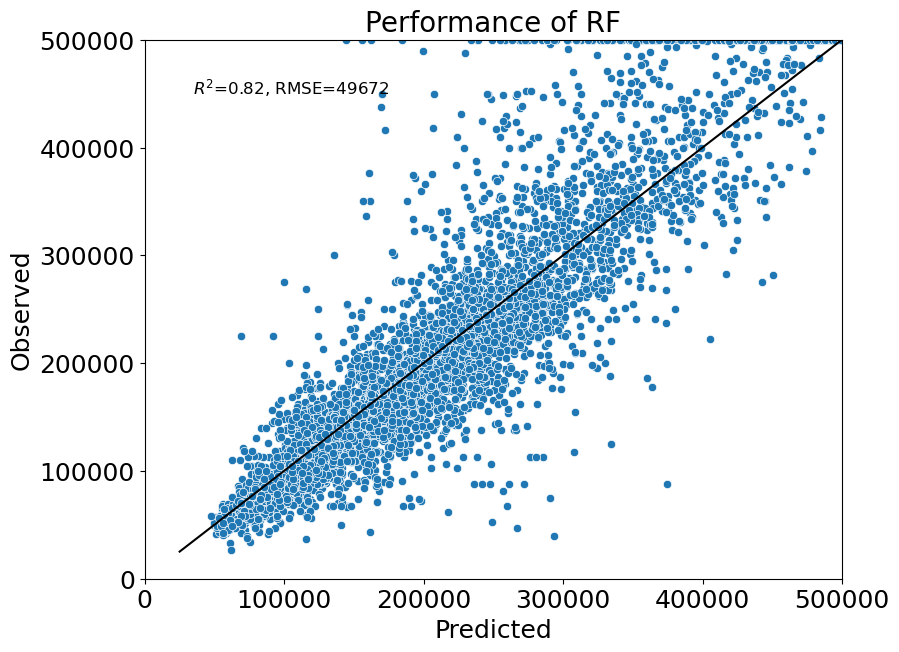

In [44]:
fig, ax = plt.subplots(figsize=(9,7))
#plt.figure(figsize=(9,7))
forest_out = forest_grid.predict(X_test)
pred_summary(forest_out, y_test, limit=500000)
ax.text(35000,
    450000,
    r'$R^2$=%.2f, RMSE=%.0f'
    % (r2_score(y_test, forest_out),np.sqrt(mean_squared_error(y_test, forest_out))),
         fontsize=12
)
plt.xlabel('Predicted', fontsize = 18); plt.ylabel('Observed', fontsize=18)
ax.set_title('Performance of RF', fontsize=20)

In [45]:
# df_train = pd.DataFrame(X_train, columns=df_model.columns)
FI_rf = pd.DataFrame(forest_grid.best_estimator_.feature_importances_, index=X.columns, columns=['Feature Importance (RF)'])
FI_rf = FI_rf.sort_values(by='Feature Importance (RF)',ascending=False)
FI_rf # major factor identification

,Feature Importance (RF)
median_income,0.386738
ocean_proximity,0.166188
SF_dist,0.120876
LA_dist,0.091604
center_dist,0.058346
population,0.040996
housing_median_age,0.040452
total_rooms,0.036217
total_bedrooms,0.027803
households,0.026491


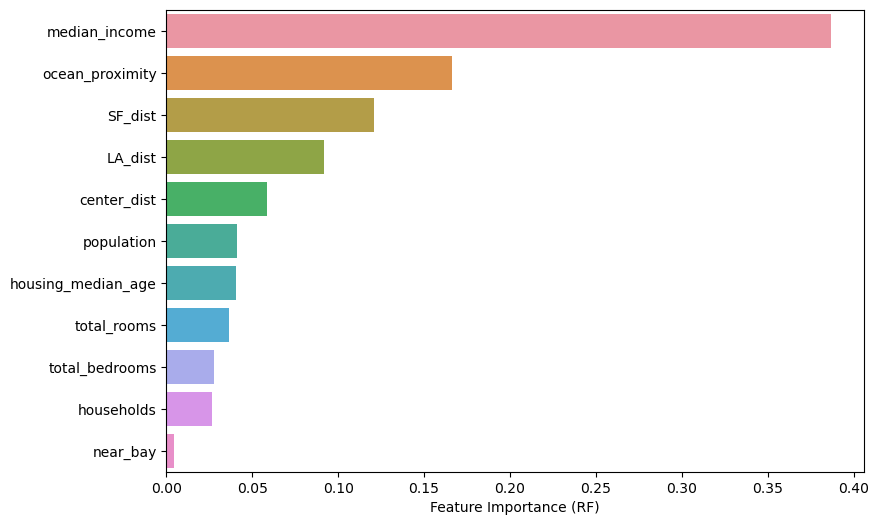

In [46]:
g1 = sns.barplot(x="Feature Importance (RF)", y=FI_rf.index, data=FI_rf)
g1.figure.set_size_inches(9, 6)

In [47]:
# # SHAP

# df_test = pd.DataFrame(X_test, columns=X.columns)
# explainer = shap.TreeExplainer(forest_grid.best_estimator_)
# shap_values = explainer(df_test)
# shap.plots.beeswarm(shap_values)

![jupyter](ca-housing/RF-SHAP.png)

## Gradient Boosting

In [48]:
gb_forest = GradientBoostingRegressor()

params = {'max_features': [6, 7],
          'learning_rate': [0.3, 0.4],
          'n_estimators': [170, 180]}

gb_forest_grid = GridSearchCV(gb_forest, params, cv=5, scoring = 'neg_mean_squared_error')
gb_forest_grid.fit(X_train, y_train)

GridSearchCV(cv=5, estimator=GradientBoostingRegressor(),
             param_grid={'learning_rate': [0.3, 0.4], 'max_features': [6, 7],
                         'n_estimators': [170, 180]},
             scoring='neg_mean_squared_error')

In [49]:
#Best estimator and CV score
print('Best score (RMSE)', np.sqrt(np.abs(gb_forest_grid.best_score_)))
print(gb_forest_grid.best_estimator_)

Best score (RMSE) 51247.09196984372
GradientBoostingRegressor(learning_rate=0.4, max_features=7, n_estimators=180)


RMSE 52866.815973484474
R2 0.796598226582591


Text(0.5, 1.0, 'Performance of GB')

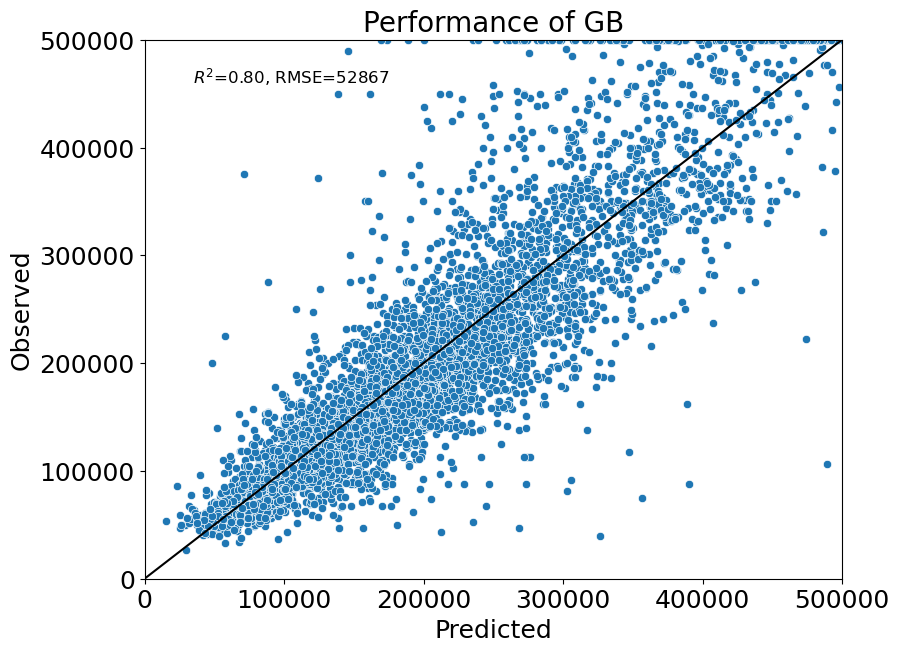

In [50]:
fig, ax = plt.subplots(figsize=(9,7))
gb_forest_out = gb_forest_grid.predict(X_test)
pred_summary(gb_forest_out, y_test, limit=500000)
ax.text(35000,
    460000,
    r'$R^2$=%.2f, RMSE=%.0f'
    % (r2_score(y_test, gb_forest_out),np.sqrt(mean_squared_error(y_test, gb_forest_out))),
         fontsize=12
)
plt.xlabel('Predicted', fontsize = 18); plt.ylabel('Observed', fontsize=18)
ax.set_title('Performance of GB', fontsize=20)

In [51]:
FI_gb = pd.DataFrame(gb_forest_grid.best_estimator_.feature_importances_, index=X.columns, columns=['Feature Importance (GB)'])
FI_gb = FI_gb.sort_values(by='Feature Importance (GB)',ascending=False)
FI_gb

,Feature Importance (GB)
median_income,0.434820
ocean_proximity,0.213654
SF_dist,0.140785
LA_dist,0.086192
population,0.034203
housing_median_age,0.026527
total_bedrooms,0.019305
center_dist,0.018479
total_rooms,0.014533
households,0.009793


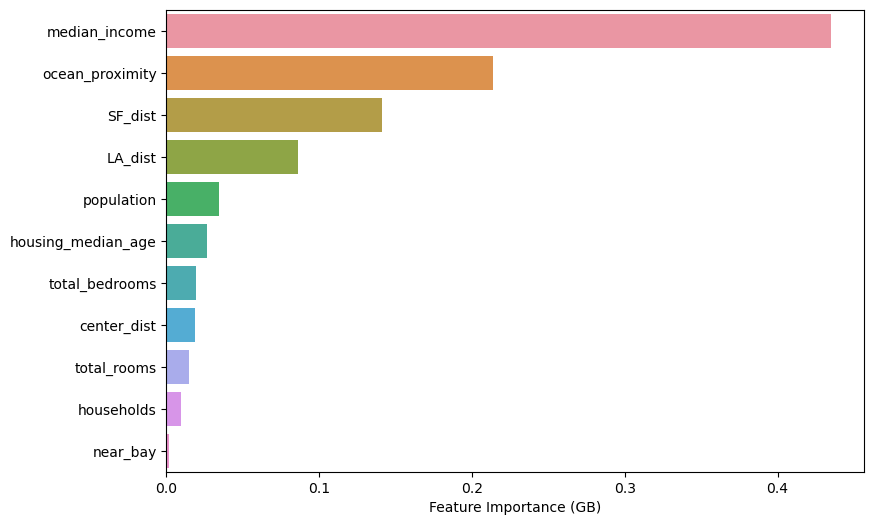

In [52]:
g2 = sns.barplot(x="Feature Importance (GB)", y=FI_gb.index, data=FI_gb)
g2.figure.set_size_inches(9, 6)

## MLP

In [53]:
# mlp_model = MLPRegressor(hidden_layer_sizes=(10,5), activation='relu')

# params = {'learning_rate_init':[0.5,0.6,0.7],
#           'max_iter':[200,300,400]}

# mlp_model_bayes = BayesSearchCV(mlp_model, params, n_jobs=-1, cv=3, scoring = 'neg_mean_squared_error')
# mlp_model_bayes.fit(X_train, y_train)
# #Best estimator and CV score
# print('Best score (RMSE)', np.sqrt(np.abs(mlp_model_bayes.best_score_)))
# print(mlp_model_bayes.best_estimator_)

In [54]:
# mlp_model2 = MLPRegressor()

# params2 = {'hidden_layer_sizes':[(500,250,100), (500,200,200,100)],
#         'learning_rate_init':[0.005, 0.01],
#         'max_iter':[200,300]}

# mlp_model_grid = GridSearchCV(mlp_model2, params2, n_jobs=-1, cv=5, scoring = 'neg_mean_squared_error')
# mlp_model_grid.fit(X_train, y_train)

# #Best estimator and CV score
# print('Best score (RMSE)', np.sqrt(np.abs(mlp_model_grid.best_score_)))
# print(mlp_model_grid.best_estimator_)

RMSE 54754.146071794086
R2 0.7818162278265959


Text(0.5, 1.0, 'Performance of MLP')

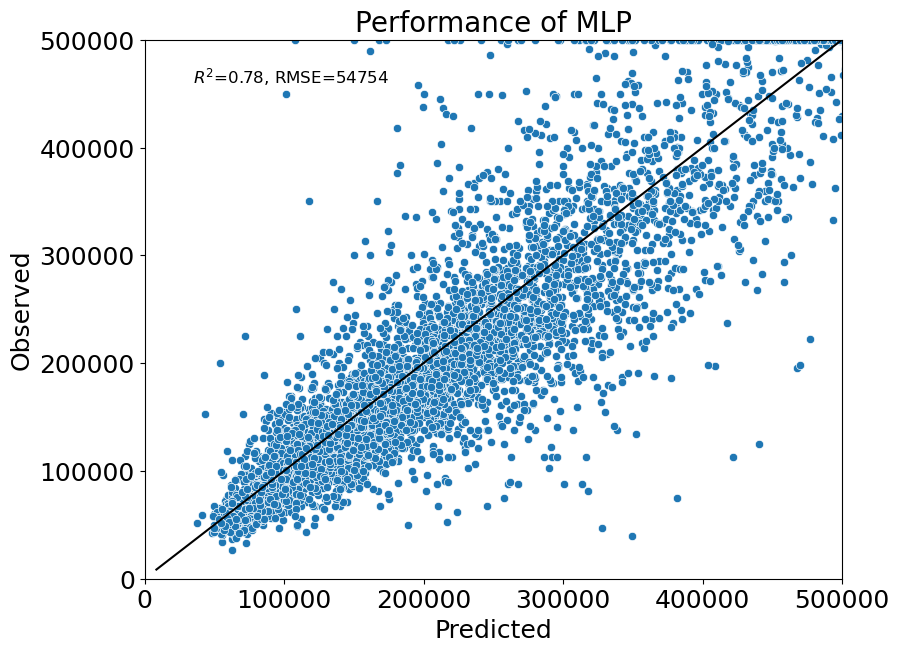

In [55]:
mlp_model = MLPRegressor(hidden_layer_sizes=(500,200,200,100), learning_rate_init=0.005)
mlp_model.fit(X_train, y_train)
fig, ax = plt.subplots(figsize=(9,7))
mlp_out = mlp_model.predict(X_test)
pred_summary(mlp_out, y_test, limit=500000)
ax.text(35000,
    460000,
    r'$R^2$=%.2f, RMSE=%.0f'
    % (r2_score(y_test, mlp_out),np.sqrt(mean_squared_error(y_test, mlp_out))),
         fontsize=12
)
plt.xlabel('Predicted', fontsize = 18); plt.ylabel('Observed', fontsize=18)
ax.set_title('Performance of MLP', fontsize=20)

In [56]:
# Permutation Importance
PI = permutation_importance(mlp_model, X_test, y_test, n_repeats=5, random_state=1)

PI_res = pd.DataFrame(data=np.transpose([PI['importances_mean'],PI['importances_std']]),
             index = X.columns, columns=['PI_mean','PI_std'])
PI_res = PI_res.sort_values(by='PI_mean',ascending=False)
PI_res

,PI_mean,PI_std
total_rooms,4.372912,0.102244
SF_dist,3.287289,0.115828
LA_dist,2.836049,0.072617
near_bay,1.852407,0.061477
population,1.301636,0.017862
households,0.493421,0.011271
median_income,0.474315,0.013711
total_bedrooms,0.303252,0.014513
ocean_proximity,0.192829,0.007481
center_dist,0.114354,0.004183


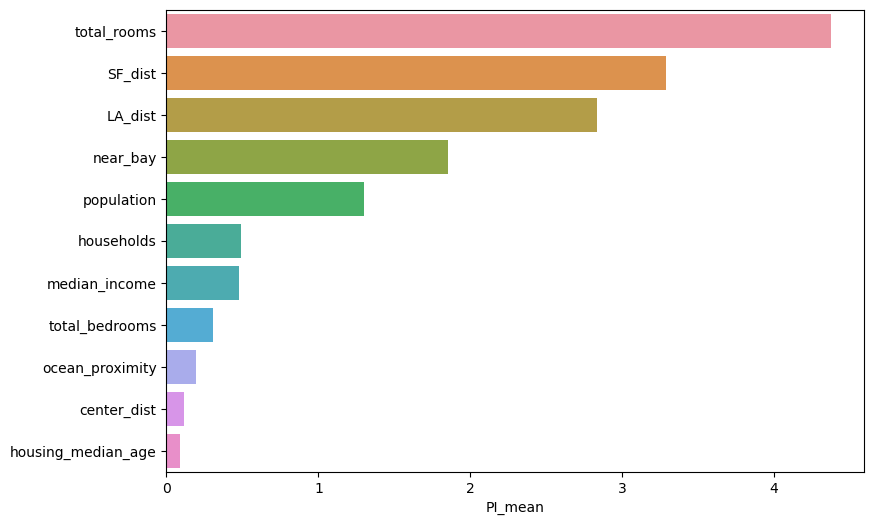

In [57]:
g = sns.barplot(x="PI_mean", y=PI_res.index, data=PI_res)
g.figure.set_size_inches(9, 6)

## Summary

In [61]:
summary_0 = pd.DataFrame({'Random Forest':list(FI_rf.index),
              'Gradient Boosting':list(FI_gb.index),
               'MLP':list(PI_res.index)})
summary_0

,Random Forest,Gradient Boosting,MLP
0,median_income,median_income,total_rooms
1,ocean_proximity,ocean_proximity,SF_dist
2,SF_dist,SF_dist,LA_dist
3,LA_dist,LA_dist,near_bay
4,center_dist,population,population
5,population,housing_median_age,households
6,housing_median_age,total_bedrooms,median_income
7,total_rooms,center_dist,total_bedrooms
8,total_bedrooms,total_rooms,ocean_proximity
9,households,households,center_dist


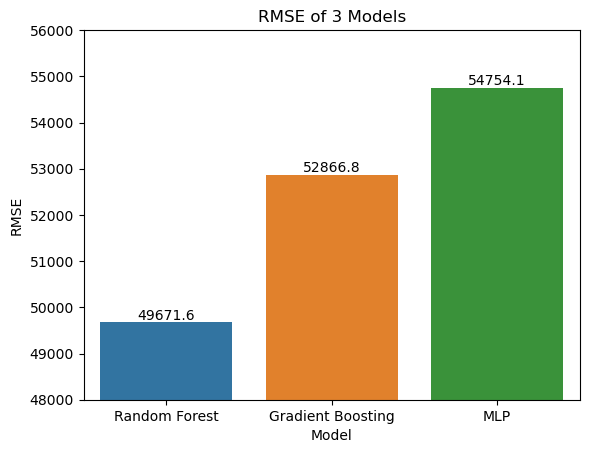

In [65]:
eva = pd.DataFrame()
eva['Model'] = ['Random Forest','Gradient Boosting','MLP']
eva['RMSE'] = [np.sqrt(mean_squared_error(y_test, forest_out)),
        np.sqrt(mean_squared_error(y_test, gb_forest_out)),
        np.sqrt(mean_squared_error(y_test, mlp_out))]
fig = sns.barplot(data=eva,y='RMSE',x='Model')
fig.set_ylim(48000,56000)
for i in fig.containers:
    fig.bar_label(i,)
plt.title('RMSE of 3 Models')
plt.show()